# Development: ORCA Integration with Milestone Tracking

In [5]:
import sys
sys.path.append('../')

sys.path.append('../../')
import numpy as np
import cvxpy as cp
from matplotlib import pyplot as plt
from panav.environment.env import NavigationEnv
from panav.environment.region import Box2DRegion, PolygonRegion
from panav.environment.utils import box_2d_center

from panav.viz import draw_env


import shapely

from panav.ORCA import ORCA_Agent
from panav.util import unique_tx

%load_ext autoreload
%autoreload 2

%load_ext snakeviz

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The snakeviz extension is already loaded. To reload it, use:
  %reload_ext snakeviz


In [6]:
import sys
sys.path.append('../')
from panav.environment.env import MultiTunnelEnv
from panav.hybrid import HybridGraph
from panav.util import flowtime,makespan
from panav.PBS.PBS import PBS
from panav.TrafficAwarePlanning import TAHP
from panav.sequential import sequential_planning
from panav.SAMP.solvers import Tube_Planning



from time import time
import pickle as pkl

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Development: ORCA Integration with Milestone Tracking

## Simulate ORCA with simple $v_{pref}$

In [94]:
%%snakeviz
agents = set(np.arange(len(start_locs)))

bloating_r = 0.5

tau = 1 # The safe time interval. Can be generously long.
exec_tau = 0.1 * tau 
# The execution time of ORCA velocity.
# Should be much shorter than the safe interval tau.

d = 2
K = 10
t0 = 0
vmax = 1.0

goal_locs = []
for a in agents:
    x = start_locs[a]*1.0
    goal_locs.append(goals[a].project(x))
  
pos = []
vs = [np.zeros(start_locs[0].shape) for a in agents]
v_opt = [np.zeros(start_locs[0].shape) for a in agents]

protocol = 0

orcas = [ORCA_Agent(protocol,tau,bloating_r,vmax,p,v) 
         for p,v in zip(start_locs,vs)]

for _ in range(400):
    pos.append(np.array([a.p for a in orcas]))
    
    # Compute the preferred velocity.
    v_prefs = [vmax * (goal-a.p)/np.linalg.norm(goal-a.p)
               for goal, a in zip(goal_locs,orcas)]
        
    # Update v_opt
    for a in agents:
        orcas[a].update_v_opt(v_prefs[a])
    
    # Compute the safe velocity.
    for a in agents:      
        orcas[a].update_v(v_prefs[a],env.obstacles,
                        [orcas[b] for b in agents-set([a])])
    
    # Execute the safe velocity.
    for a in agents:
        if np.linalg.norm(orcas[a].p-goal_locs[a])>= 1*bloating_r:
            orcas[a].p += orcas[a].v*exec_tau

KeyboardInterrupt: 

**Visualize the trajectories**

/Users/tianpengzhang/opt/miniconda3/envs/PA-Nav/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(


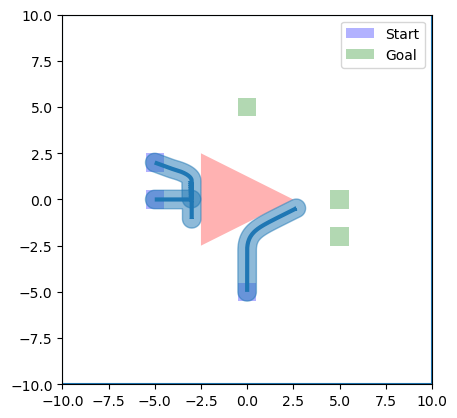

In [10]:

from shapely.plotting import plot_polygon, plot_line
pos = np.array(pos)

ax = plt.gca()
draw_env(env,[],ax)

for a in agents:
    line = shapely.geometry.LineString(pos[:,a,:])
    dilated = line.buffer(bloating_r)

    plot_line(line, ax=ax, add_points=False, linewidth=3)
    plot_polygon(dilated, ax=ax, add_points=False, alpha=0.5)

**Animate the motions**

In [5]:
from panav.viz import animation
from IPython.display import HTML, display

dt = 0.025

pos_to_ani = [pos[:,a,:].T for a in agents]
anim = animation(env, pos_to_ani, bloating_r, dt = dt)
display(HTML(anim.to_jshtml()))
anim.save('Single Agent Deadlock.gif')
plt.close() 

MovieWriter ffmpeg unavailable; using Pillow instead.


**Observation**: The simple $v_{pref}$ which always points to the goal location is not enough to get the agents around the obstacle.

## Plan waypoints with MILP for individual agents, ignoring inter-agent conflicts. Use a simple controller to generate $v_{pref}$ that tracks the waypoints. Use ORCA to convert $v_{pref}$ to safe velocities.

**Construct the same environment**

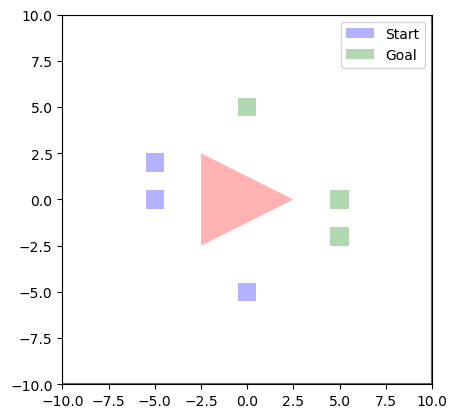

In [7]:

start_locs = np.array([[0,-5],[-5,0],[-5,2]])*1.0
goal_locs = np.array([[0,5],[5,0],[5,-2]])*1.0


start_box_side = np.array([1,1])
goal_box_side = np.array([1,1])

limits = [(-10.0,10.0),(-10.0,10.0)]

O1 = PolygonRegion([(-2.5,2.5),(-2.5,-2.5),(2.5,0)])

env = NavigationEnv(limits,[O1],start_locs,goal_locs)

draw_env(env)

**Compute individual paths that avoid all static obstacles**

In [8]:

agents = set(np.arange(len(start_locs)))

plans = []

bloating_r = 0.5
d = 2
K = 10
t0 = 0
vmax = 1.0


for agent in agents:
    start = env.starts[agent]
    goal = env.goals[agent]

    solver = Tube_Planning(env,start,goal,vmax,bloating_r,d,K_max = K,t0=0)

    times, xs = solver.plan()

    times,xs = unique_tx(times,xs)
    plans.append(xs)

num obstacle trajectories:0/0
Set parameter Username
Academic license - for non-commercial use only - expires 2025-02-15
num obstacle trajectories:0/0
num obstacle trajectories:0/0


In [9]:
plans

[array([[-0.     ,  3.61803,  0.25   ],
        [-5.     ,  0.     ,  4.75   ]]),
 array([[-5.     , -3.     ,  4.75   ],
        [-0.     , -3.30902,  0.     ]]),
 array([[-5.     , -3.     ,  4.75   ],
        [ 2.     , -3.30902, -1.75   ]])]

In [32]:
# %%snakeviz

tau = 1 # The safe time interval. Can be generously long.
exec_tau = 0.1 * tau 
# The execution time of ORCA velocity.
# Should be much shorter than the safe interval tau.

pos = []

v_prefs = [np.zeros(start_locs[0].shape) for a in agents]

protocol = 0

orcas = [ORCA_Agent(protocol,tau,bloating_r,vmax,p,v) 
         for p,v in zip(start_locs,v_prefs)]

curr_wp_index = [0 for a in agents]


for _ in range(200):
    pos.append(np.array([a.p for a in orcas]))
    
    
   
    # Compute the preferred velocity.
    for agent in agents:

        wp = plans[agent][:,curr_wp_index[agent]]
        # See if the agent has reached the current waypoint.
        if np.linalg.norm(wp-orcas[agent].p)<= bloating_r:  
            curr_wp_index[agent] = \
            np.min([curr_wp_index[agent]+1,   
                    plans[agent].shape[1]-1
                                  ])
            
            wp = plans[agent][:,curr_wp_index[agent]]
            
        to_wp = wp-orcas[agent].p

        
        v_prefs[agent] = vmax * to_wp / np.linalg.norm(to_wp)
    
    # Update v_opt
    for a in agents:
        orcas[a].update_v_opt(v_prefs[a])
    
    # Compute the safe velocity.
    for a in agents:      
        orcas[a].update_v(v_prefs[a],env.obstacles,
                        [orcas[b] for b in agents-set([a])])
    
    # Execute the safe velocity.
    all_reached = True
    for a in agents:
        if np.linalg.norm(orcas[a].p - goal_locs[a])>=1*bloating_r:
            orcas[a].p += orcas[a].v*exec_tau
            all_reached = False
    if all_reached:
        break

**Visualize the trajectories**

/Users/tianpengzhang/opt/miniconda3/envs/PA-Nav/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(


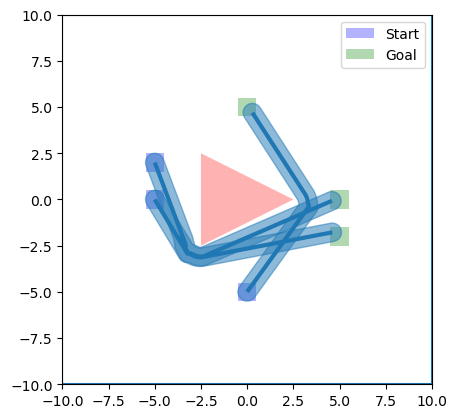

In [33]:

from shapely.plotting import plot_polygon, plot_line
pos = np.array(pos)

ax = plt.gca()
draw_env(env,[],ax)

for a in agents:
    line = shapely.geometry.LineString(pos[:,a,:])
    dilated = line.buffer(bloating_r)

    plot_line(line, ax=ax, add_points=False, linewidth=3)
    plot_polygon(dilated, ax=ax, add_points=False, alpha=0.5)

**Animate the motions**

In [34]:
from panav.viz import animation
from IPython.display import HTML, display

dt = 0.025

pos_to_ani = [pos[:,a,:].T for a in agents]
anim = animation(env, pos_to_ani, bloating_r, dt = dt)
display(HTML(anim.to_jshtml()))
plt.close() 

**Observation**: Letting $v_{pref}$ follow the individually planned paths is sufficient for the agents to reach their goals while staying safe.

## The problem of deadlock

On more challenging environments, planning waypoints for individual agents while ignoring inter-agent conflicts could be insufficient. For example, such paradigm could result in deadlock, as show below. 

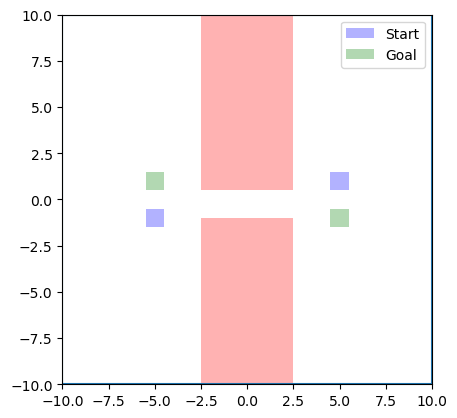

In [21]:

start_locs = np.array([[5,1],[-5,-1]])*1.0
goal_locs = np.array([[-5,1],[5,-1]])*1.0


start_box_side = np.array([1,1])
goal_box_side = np.array([1,1])


O1 = Box2DRegion((-2.5,2.5),(0.5,10))
O2 = Box2DRegion((-2.5,2.5),(-10,-1.0))

limits = [(-10.0,10.0),(-10.0,10.0)]

bloating_r = 0.5 

env = NavigationEnv(limits,[O1,O2],start_locs,goal_locs)

draw_env(env)

**Compute individual paths that avoid all static obstacles**

In [23]:
agents = set(np.arange(len(start_locs)))

plans = []

bloating_r = 0.5
d = 2
K = 10
t0 = 0
vmax = 1.0

for agent in agents:
    start = env.starts[agent]
    goal = env.goals[agent]

    solver = Tube_Planning(env,start,goal,vmax,bloating_r,d,K_max = K,t0=0)

    times, xs = solver.plan()

    times,xs = unique_tx(times,xs)
    plans.append(xs)

num obstacle trajectories:0/0
num obstacle trajectories:0/0


In [24]:
# %%snakeviz

tau = 1 # The safe time interval. Can be generously long.
exec_tau = 0.1 * tau 
# The execution time of ORCA velocity.
# Should be much shorter than the safe interval tau.

pos = []

v_prefs = [np.zeros(start_locs[0].shape) for a in agents]

protocol = 0

orcas = [ORCA_Agent(protocol,tau,bloating_r,vmax,p,v) 
         for p,v in zip(start_locs,v_prefs)]

curr_wp_index = [0 for a in agents]


for _ in range(200):
    pos.append(np.array([a.p for a in orcas]))
    
    
   
    # Compute the preferred velocity.
    for agent in agents:

        wp = plans[agent][:,curr_wp_index[agent]]
        # See if the agent has reached the current waypoint.
        if np.linalg.norm(wp-orcas[agent].p)<= bloating_r:  
            curr_wp_index[agent] = \
            np.min([curr_wp_index[agent]+1,   
                    plans[agent].shape[1]-1
                                  ])
            
            wp = plans[agent][:,curr_wp_index[agent]]
            
        to_wp = wp-orcas[agent].p

        
        v_prefs[agent] = vmax * to_wp / np.linalg.norm(to_wp)
    
    # Update v_opt
    for a in agents:
        orcas[a].update_v_opt(v_prefs[a])
    
    # Compute the safe velocity.
    for a in agents:      
        orcas[a].update_v(v_prefs[a],env.obstacles,
                        [orcas[b] for b in agents-set([a])])
    
    # Execute the safe velocity.
    all_reached = True
    for a in agents:
        if np.linalg.norm(orcas[a].p - goal_locs[a])>=1*bloating_r:
            orcas[a].p += orcas[a].v*exec_tau
            all_reached = False
    if all_reached:
        break

**Visualize the trajectories**

/Users/tianpengzhang/opt/miniconda3/envs/PA-Nav/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(


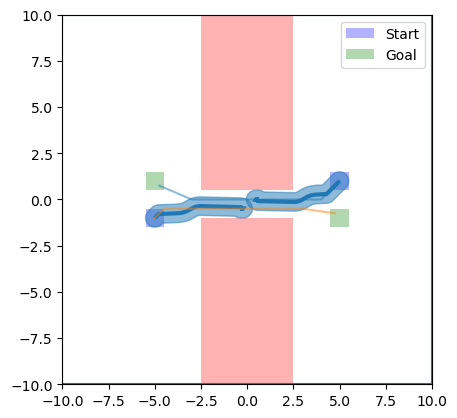

In [25]:

from shapely.plotting import plot_polygon, plot_line
pos = np.array(pos)

ax = plt.gca()
draw_env(env,plans,ax)

for a in agents:
    line = shapely.geometry.LineString(pos[:,a,:])
    dilated = line.buffer(bloating_r)

    plot_line(line, ax=ax, add_points=False, linewidth=3)
    plot_polygon(dilated, ax=ax, add_points=False, alpha=0.5)

**Animate the motions**

In [26]:
from panav.viz import animation
from IPython.display import HTML, display

dt = 0.025

pos_to_ani = [pos[:,a,:].T for a in agents]
anim = animation(env, pos_to_ani, bloating_r, dt = dt)
display(HTML(anim.to_jshtml()))
plt.close() 

The deadlock is a result of simplistic planning, but not a fault of ORCA. If the planning takes into account the conflict between agents, deadlock won't arise. MAMP algorithms like S2M2 can be used to compute a conflict-free multi-agent plan. 

ORCA should still be carried out in low-level tracking, to account for unforseen inter-agent conflicts caused by small disturbances(like bumpiness in the terrain).

If some significant changes to the global multi-agent plan needs to be made, e.g., new obstacles showing up in the environment causing the agents to substantially deviate from their initial plans, global re-planning needs to be done. Such re-planning can be time consuming, and the agents should keep performing ORCA locally with $v_{pref}=0$ while waiting(**perhaps better solutions than this exist**).